In [23]:
# # Clean env (to avoid dependency issues)

# !conda clean --all -y
# !pip cache purge

IDEA
1. sdxl+inpaint with inverted mask over composite image
2. sdxl+inpaint+controlnets over composite image with inverted mask (modify lightning)
3. InstructPix2Pix for style adgustments over combined image
4. Img2Img on very low guidance level for small adjustments

In [24]:
# # Install dependencies

# # Install PyTorch 2.1.0 with CUDA 12.1 (L4 GPU compatible)
# !pip install torch==2.1.0 torchvision==0.16.0 torchaudio==2.1.0 --index-url https://download.pytorch.org/whl/cu121

# # Install stable Numpy (1.x branch to avoid the PyTorch Numpy 2.0 bug)

# # Install xformers matched EXACTLY to PyTorch 2.1.0
# !pip install xformers==0.0.22.post7

# # Install the rest of your UI/ML stack
# !pip install diffusers==0.27.2 transformers==4.38.2 accelerate
# !pip install opencv-python pillow matplotlib scikit-learn
# !pip install controlnet-aux invisible-watermark  huggingface_hub==0.23.2
# !pip install mediapipe==0.10.14 lpips torchmetrics ultralytics==8.3.76 ftfy==6.2.0 segment-anything==1.0  

# !pip install "numpy==1.26.4"


In [25]:
from PIL import Image
import numpy as np
import cv2
import os

import torch

from fitting_helper import fit_glasses_to_face

from evaluate_qualitative import calculate_lpips, calculate_sam_clip_metrics


from matplotlib import pyplot as plt

device = "cuda" if torch.cuda.is_available() else "cpu"

glasses_articles = [
    "110020220079_01.png", 
    #"110020220086_01.png", 
    "110020234383_01.png", 
    #"190605021125_01.png",
    "190605067703_01.png"
    ]

glasses_with_masks = []

for article in glasses_articles:
    
    new_glasses = Image.open(f"../../frames_new/imgs/{article}").convert("RGB").resize((512, 512))
    new_masks = Image.open(f"../../frames_new/masks/{article}").convert("L").resize((512, 512))
    
    glasses_with_masks.append((new_glasses, new_masks))

bg_articles = [
    "../../results/real_faces/FFHQ_3.jpg",
    "../../results/real_faces/FFHQ_4.jpg",
    "../../results/real_faces/FFHQ_5.jpg"
]

bg_imgs = []

for a in bg_articles:
    new_bg = Image.open(a).convert("RGB").resize((512, 512))
    bg_imgs.append(new_bg)

SDXL inpaint + inverted mask

In [26]:
# Load pipelines

import warnings
warnings.filterwarnings('ignore')

from PIL import ImageFilter

import torch
from diffusers import StableDiffusionXLControlNetPipeline, ControlNetModel, StableDiffusionXLInpaintPipeline, StableDiffusionInpaintPipeline, StableDiffusionInstructPix2PixPipeline, PaintByExamplePipeline, StableDiffusionImg2ImgPipeline, StableDiffusionPipeline, StableDiffusionControlNetPipeline#, MultiControlNetModel
from controlnet_aux import CannyDetector, MidasDetector

import os, sys

dtype = torch.float16 if torch.cuda.is_available() else torch.float32
device = "cuda" if torch.cuda.is_available() else "cpu"

pipe_sdxl_inpaint = StableDiffusionXLInpaintPipeline.from_pretrained(
    "diffusers/stable-diffusion-xl-1.0-inpainting-0.1",
    torch_dtype=dtype,
    use_safetensors=True
).to(device)

pipe_sd_inpaint = StableDiffusionInpaintPipeline.from_pretrained(
    "runwayml/stable-diffusion-inpainting",
    torch_dtype=dtype
).to(device)


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

The config attributes {'decay': 0.9999, 'inv_gamma': 1.0, 'min_decay': 0.0, 'optimization_step': 37000, 'power': 0.6666666666666666, 'update_after_step': 0, 'use_ema_warmup': False} were passed to UNet2DConditionModel, but are not expected and will be ignored. Please verify your config.json configuration file.
unet/diffusion_pytorch_model.safetensors not found


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Face 0 x Glasses 0 | LPIPS (V): 0.3880 | SAM IoU (^): 0.0896 | SAM Dice (V): 0.8355


  0%|          | 0/4 [00:00<?, ?it/s]

Face 0 x Glasses 1 | LPIPS (V): 0.3902 | SAM IoU (^): 0.0682 | SAM Dice (V): 0.8723


  0%|          | 0/4 [00:00<?, ?it/s]

Face 0 x Glasses 2 | LPIPS (V): 0.3851 | SAM IoU (^): 0.0487 | SAM Dice (V): 0.9071


  0%|          | 0/4 [00:00<?, ?it/s]

Face 1 x Glasses 0 | LPIPS (V): 0.3128 | SAM IoU (^): 0.1224 | SAM Dice (V): 0.7819


  0%|          | 0/4 [00:00<?, ?it/s]

Face 1 x Glasses 1 | LPIPS (V): 0.3079 | SAM IoU (^): 0.0689 | SAM Dice (V): 0.8711


  0%|          | 0/4 [00:00<?, ?it/s]

Face 1 x Glasses 2 | LPIPS (V): 0.3165 | SAM IoU (^): 0.0187 | SAM Dice (V): 0.9633


  0%|          | 0/4 [00:00<?, ?it/s]

Face 2 x Glasses 0 | LPIPS (V): 0.2982 | SAM IoU (^): 0.0592 | SAM Dice (V): 0.8883


  0%|          | 0/4 [00:00<?, ?it/s]

Face 2 x Glasses 1 | LPIPS (V): 0.2999 | SAM IoU (^): 0.0402 | SAM Dice (V): 0.9228


  0%|          | 0/4 [00:00<?, ?it/s]

Face 2 x Glasses 2 | LPIPS (V): 0.3067 | SAM IoU (^): 0.0555 | SAM Dice (V): 0.8948
Saved individual results and grid to results/diffusion_blend/sdxl_inpaint_glasses


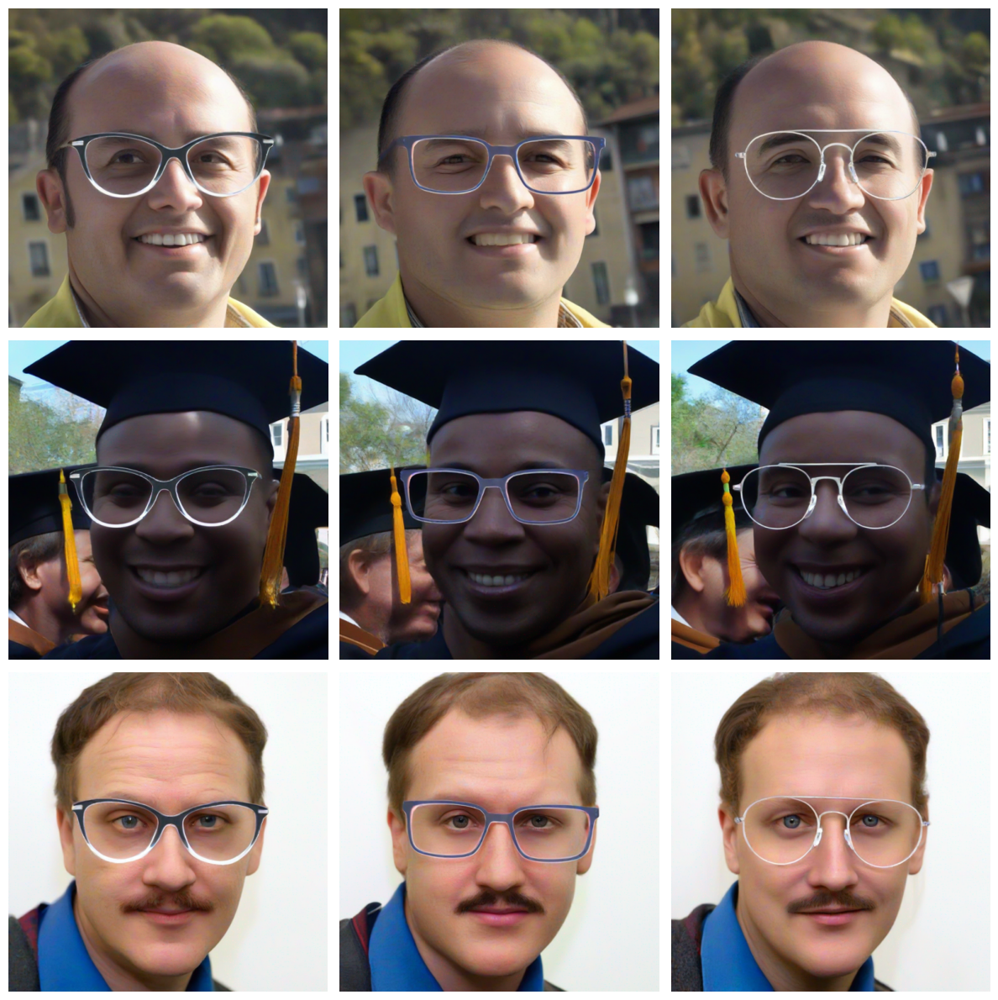

In [27]:
# simple inpainting

method_name = "sdxl_inpaint_glasses"

def sdxl_inpaint_glasses(glasses_img, mask_img, face_img, device="cuda"):
    
    face_resized = face_img.resize((1024,1024))
    mask_resized = mask_img.resize((1024,1024))
    glasses_resized = glasses_img.resize((1024,1024))
    
    gradient_mask = Image.fromarray(np.array(mask_resized)).filter(ImageFilter.GaussianBlur(radius=11))
    mask_inverted = Image.fromarray(255 - np.array(gradient_mask))
    
    composite = face_resized.copy()
    composite.paste(glasses_resized, (0, 0), mask_resized)

    pipe_sdxl_inpaint.safety_checker = lambda images, *args, **kwargs: (images, [False])

    result = pipe_sdxl_inpaint(
        prompt="copy lightning and shadowing style from unmasked to masked",
        image=composite,
        mask_image=mask_inverted,  # white = inpaint region
        negative_prompt="blurry, low quality, poor attention to detail, inconsistent",
        num_inference_steps=7,
        strength=0.7,
        guidance_scale=1.1
    ).images[0]

    result = result.resize((512, 512))
    
    # 3 - 0.8 - 3.0 or 25 - 0.7 - 7.5
    

    return result

output_dir = f"results/diffusion_blend/{method_name}"
os.makedirs(output_dir, exist_ok=True)
os.makedirs("temp_eval", exist_ok=True)

num_faces = len(bg_imgs)
num_glasses = len(glasses_with_masks)

fig, axes = plt.subplots(nrows=num_faces, ncols=num_glasses, figsize=(4 * num_glasses, 4 * num_faces))

# If it's a 1D array (e.g. 1 face, 3 glasses), wrap it to avoid indexing errors
if num_faces == 1 or num_glasses == 1:
    axes = np.array(axes).reshape(num_faces, num_glasses)

for f_idx, bg_img in enumerate(bg_imgs):
    for g_idx, (glasses, mask) in enumerate(glasses_with_masks):
        
        # 0. Fit glasses to face
        aligned_glasses, aligned_mask = fit_glasses_to_face(bg_img, glasses, mask)
        
        # A. Run Diffusion Harmonization
        result = sdxl_inpaint_glasses(aligned_glasses, aligned_mask, bg_img)
        
        # B. Save the result
        res_path = os.path.join(output_dir, f"FFHQ_{f_idx}x{g_idx}.png")
        result.save(res_path)
        
        # C. Create & Save Naive Copy-Paste (needed for LPIPS baseline)
        naive_result = Image.composite(aligned_glasses, bg_img, aligned_mask)
        naive_path = f"temp_eval/naive_{f_idx}x{g_idx}.png"
        naive_result.save(naive_path)
        
        # D. Save mask temporarily (needed for SAM 2 eval)
        mask_path = f"temp_eval/mask_{g_idx}.png"
        mask.save(mask_path)
        
        # E. Calculate Qualitative Scores
        lpips_score = calculate_lpips(naive_path, res_path)
        iou, mse, dice, sam_mask = calculate_sam_clip_metrics(res_path, mask_path)
        
        cv2.imwrite(os.path.join(output_dir, f"FFHQ_{f_idx}x{g_idx})sam_mask.png"), sam_mask)
        
        print(f"Face {f_idx} x Glasses {g_idx} | LPIPS (V): {lpips_score:.4f} | SAM IoU (^): {iou:.4f} | SAM Dice (V): {dice:.4f}")
        
        # F. Plot on the Grid
        ax = axes[f_idx, g_idx]
        ax.imshow(result)
        ax.axis("off")
        


plt.tight_layout()
grid_path = os.path.join(output_dir, "grid_summary.png")
plt.savefig(grid_path, dpi=600, bbox_inches='tight')
print(f"Saved individual results and grid to {output_dir}")
plt.show()

  0%|          | 0/3 [00:00<?, ?it/s]

Face 0 x Glasses 0 | LPIPS (V): 0.3892 | SAM IoU (^): 0.1261 | SAM Dice (V): 0.7761


  0%|          | 0/3 [00:00<?, ?it/s]

Face 0 x Glasses 1 | LPIPS (V): 0.3829 | SAM IoU (^): 0.0182 | SAM Dice (V): 0.9642


  0%|          | 0/3 [00:00<?, ?it/s]

Face 0 x Glasses 2 | LPIPS (V): 0.3933 | SAM IoU (^): 0.0000 | SAM Dice (V): 1.0000


  0%|          | 0/3 [00:00<?, ?it/s]

Face 1 x Glasses 0 | LPIPS (V): 0.3102 | SAM IoU (^): 0.1098 | SAM Dice (V): 0.8022


  0%|          | 0/3 [00:00<?, ?it/s]

Face 1 x Glasses 1 | LPIPS (V): 0.3092 | SAM IoU (^): 0.0940 | SAM Dice (V): 0.8281


  0%|          | 0/3 [00:00<?, ?it/s]

Face 1 x Glasses 2 | LPIPS (V): 0.3119 | SAM IoU (^): 0.0365 | SAM Dice (V): 0.9295


  0%|          | 0/3 [00:00<?, ?it/s]

Face 2 x Glasses 0 | LPIPS (V): 0.3000 | SAM IoU (^): 0.0729 | SAM Dice (V): 0.8640


  0%|          | 0/3 [00:00<?, ?it/s]

Face 2 x Glasses 1 | LPIPS (V): 0.3067 | SAM IoU (^): 0.0415 | SAM Dice (V): 0.9203


  0%|          | 0/3 [00:00<?, ?it/s]

Face 2 x Glasses 2 | LPIPS (V): 0.3212 | SAM IoU (^): 0.0558 | SAM Dice (V): 0.8944
Saved individual results and grid to results/diffusion_blend/attention_diffusion


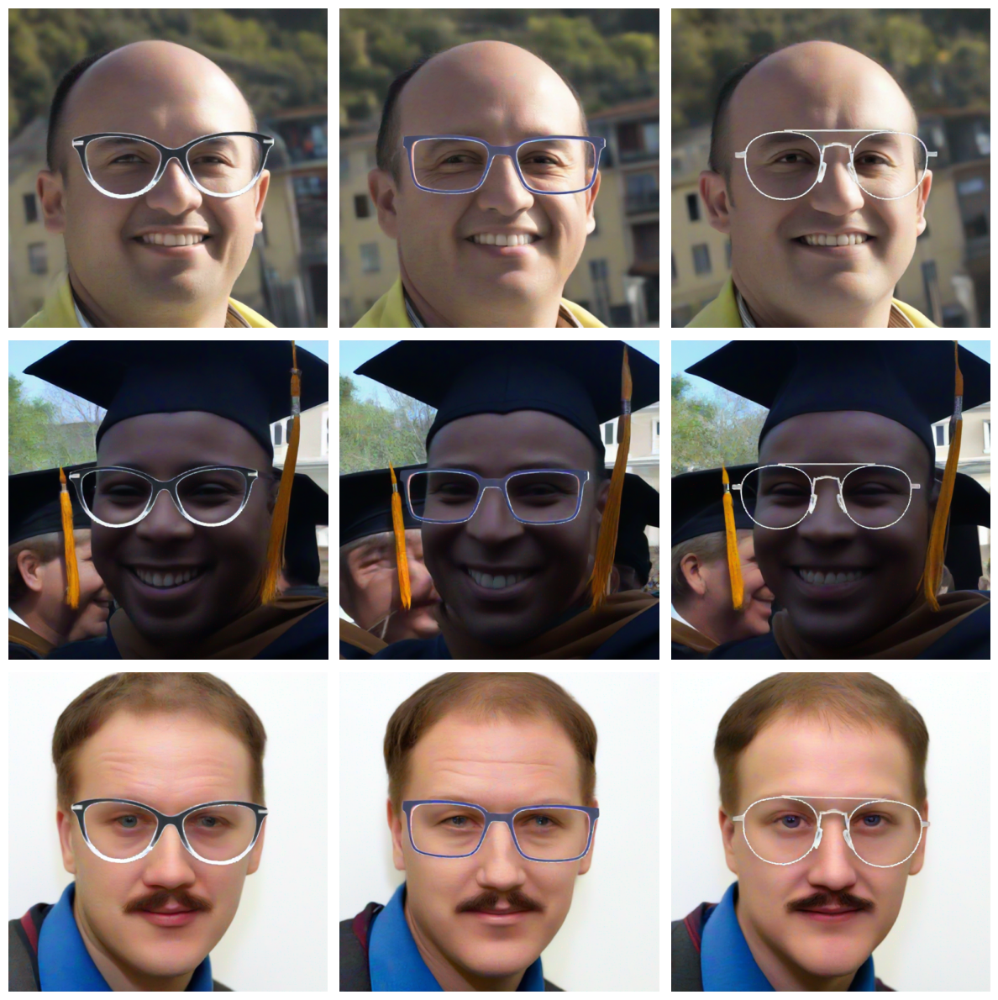

In [28]:
method_name = "attention_diffusion"

def attention_diffusion(glasses_img, mask_img, face_img, inverted = False, device="cuda"):
    """
    Advanced Diffusion with Attention Harmonization
    Uses attention mechanisms for precise harmonization
    """
    
    # Gradient masks for attention
    
    face_resized = face_img.resize((1024,1024))
    mask_resized = mask_img.resize((1024,1024))
    glasses_resized = glasses_img.resize((1024,1024))
    
    gradient_mask = Image.fromarray(np.array(mask_resized)).filter(ImageFilter.GaussianBlur(radius=7))

    if not inverted:
        mask_inverted = Image.fromarray(255 - np.array(mask_resized))
    else:
        mask_inverted = gradient_mask
    
    composite = face_resized.copy()
    composite.paste(glasses_resized, (0, 0), mask_resized)
    
    pipe_sd_inpaint.safety_checker = lambda images, *args, **kwargs: (images, [False])
    
    # Stable diffusion with with attention focus
    result = pipe_sdxl_inpaint( # also try sdxl_inpain
        prompt="copy lightning and shadowing style from unmasked to masked, add shadow",
        image=composite,
        mask_image=mask_inverted,
        negative_prompt="blurry, low quality, poor attention to detail, inconsistent",
        num_inference_steps=5,
        strength=0.7,
        guidance_scale=1.1
    ).images[0]
    
    
    # Apply attention-based post-processing
    result_np = np.array(result)
    face_np = np.array(face_resized)
    attention_weight = np.array(gradient_mask) / 255.0
    attention_3d = np.stack([attention_weight] * 3, axis=-1)
    
    final_result = result_np * (1 - attention_3d) + result_np * attention_3d
    return Image.fromarray(final_result.astype(np.uint8))

output_dir = f"results/diffusion_blend/{method_name}"
os.makedirs(output_dir, exist_ok=True)
os.makedirs("temp_eval", exist_ok=True)

num_faces = len(bg_imgs)
num_glasses = len(glasses_with_masks)

fig, axes = plt.subplots(nrows=num_faces, ncols=num_glasses, figsize=(4 * num_glasses, 4 * num_faces))

# If it's a 1D array (e.g. 1 face, 3 glasses), wrap it to avoid indexing errors
if num_faces == 1 or num_glasses == 1:
    axes = np.array(axes).reshape(num_faces, num_glasses)

for f_idx, bg_img in enumerate(bg_imgs):
    for g_idx, (glasses, mask) in enumerate(glasses_with_masks):
        
        # 0. Fit glasses to face
        aligned_glasses, aligned_mask = fit_glasses_to_face(bg_img, glasses, mask)
        
        # A. Run Diffusion Harmonization
        result = attention_diffusion(aligned_glasses, aligned_mask, bg_img, device=device)
        
        # B. Save the result
        res_path = os.path.join(output_dir, f"FFHQ_{f_idx}x{g_idx}.png")
        result = result.resize((512, 512))
        result.save(res_path)
        
        # C. Create & Save Naive Copy-Paste (needed for LPIPS baseline)
        naive_result = Image.composite(aligned_glasses, bg_img, aligned_mask)
        naive_path = f"temp_eval/naive_{f_idx}x{g_idx}.png"
        naive_result.save(naive_path)
        
        # D. Save mask temporarily (needed for SAM 2 eval)
        mask_path = f"temp_eval/mask_{g_idx}.png"
        mask.save(mask_path)
        
        # E. Calculate Qualitative Scores
        lpips_score = calculate_lpips(naive_path, res_path)
        iou, mse, dice, sam_mask = calculate_sam_clip_metrics(res_path, mask_path)
        
        cv2.imwrite(os.path.join(output_dir, f"FFHQ_{f_idx}x{g_idx})sam_mask.png"), sam_mask)
        
        print(f"Face {f_idx} x Glasses {g_idx} | LPIPS (V): {lpips_score:.4f} | SAM IoU (^): {iou:.4f} | SAM Dice (V): {dice:.4f}")
        
        # F. Plot on the Grid
        ax = axes[f_idx, g_idx]
        ax.imshow(result)
        ax.axis("off")
        


plt.tight_layout()
grid_path = os.path.join(output_dir, "grid_summary.png")
plt.savefig(grid_path, dpi=600, bbox_inches='tight')
print(f"Saved individual results and grid to {output_dir}")
plt.show()

# for i, (glasses, mask) in enumerate(glasses_with_masks):
#     result = attention_diffusion(glasses, mask, bg_img, device=device)
#     plt.figure()
#     plt.imshow(result)
#     plt.axis("off")
#     plt.title(f"Glasses->face {i+1}")
# plt.show()

In [29]:
# load controlnets to be injected

depth_estimator = MidasDetector.from_pretrained(
   "lllyasviel/Annotators"
)

canny_detector = CannyDetector()

controlnet_canny = ControlNetModel.from_pretrained(
    "diffusers/controlnet-canny-sdxl-1.0",
    torch_dtype=dtype,
    use_safetensors=True
).to(device)

controlnet_depth = ControlNetModel.from_pretrained(
    "diffusers/controlnet-depth-sdxl-1.0",
    torch_dtype=torch.float16 if device == "cuda" else torch.float32,
    use_safetensors=True
).to(device)

#multi_controlnet = MultiControlNetModel([controlnet_canny, controlnet_depth])

  0%|          | 0/4 [00:00<?, ?it/s]

Face 0 x Glasses 0 | LPIPS (V): 0.3913 | SAM IoU (^): 0.0839 | SAM Dice (V): 0.8452


  0%|          | 0/4 [00:00<?, ?it/s]

Face 0 x Glasses 1 | LPIPS (V): 0.3954 | SAM IoU (^): 0.0666 | SAM Dice (V): 0.8751


  0%|          | 0/4 [00:00<?, ?it/s]

Face 0 x Glasses 2 | LPIPS (V): 0.3843 | SAM IoU (^): 0.0000 | SAM Dice (V): 1.0000


  0%|          | 0/4 [00:00<?, ?it/s]

Face 1 x Glasses 0 | LPIPS (V): 0.3016 | SAM IoU (^): 0.1120 | SAM Dice (V): 0.7986


  0%|          | 0/4 [00:00<?, ?it/s]

Face 1 x Glasses 1 | LPIPS (V): 0.3035 | SAM IoU (^): 0.0827 | SAM Dice (V): 0.8473


  0%|          | 0/4 [00:00<?, ?it/s]

Face 1 x Glasses 2 | LPIPS (V): 0.3052 | SAM IoU (^): 0.0289 | SAM Dice (V): 0.9438


  0%|          | 0/4 [00:00<?, ?it/s]

Face 2 x Glasses 0 | LPIPS (V): 0.2943 | SAM IoU (^): 0.0781 | SAM Dice (V): 0.8552


  0%|          | 0/4 [00:00<?, ?it/s]

Face 2 x Glasses 1 | LPIPS (V): 0.3000 | SAM IoU (^): 0.0408 | SAM Dice (V): 0.9217


  0%|          | 0/4 [00:00<?, ?it/s]

Face 2 x Glasses 2 | LPIPS (V): 0.2966 | SAM IoU (^): 0.0691 | SAM Dice (V): 0.8708
Saved individual results and grid to results/diffusion_blend/controlnet_inpaint


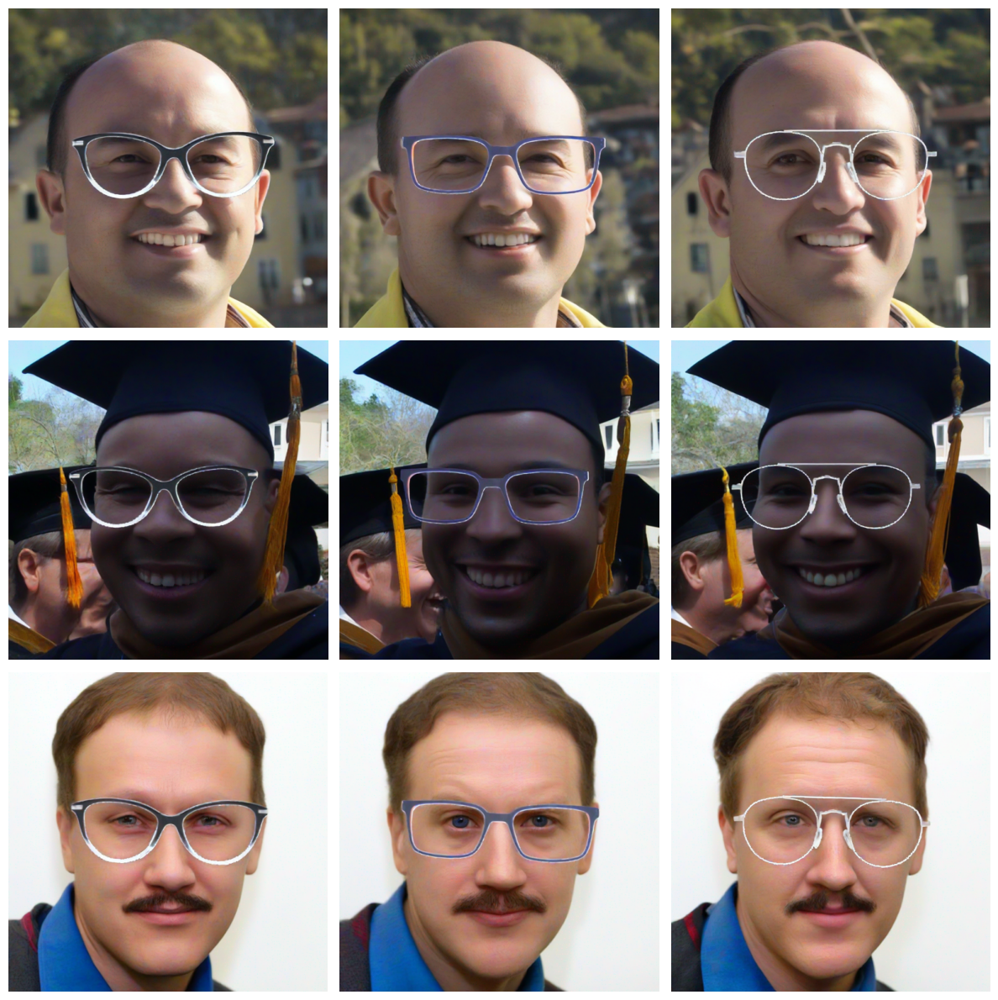

In [30]:
method_name = "controlnet_inpaint"

def sdxl_inpaint_glasses(glasses_img, mask_img, face_img, controlnet="canny", device="cuda"):
    
    glasses_resized = glasses_img.resize((1024, 1024))
    face_resized = face_img.resize((1024, 1024))
    mask_resized = mask_img.resize((1024, 1024))
    
    mask_inverted = Image.fromarray(255 - np.array(mask_resized))
    
    composite = face_resized.copy()
    composite.paste(glasses_resized, (0, 0), mask_resized)
    
    if controlnet == "canny":
        control_image = canny_detector(composite)
        pipe_sdxl_inpaint.controlnet = controlnet_canny
    elif controlnet == "depth":
        control_image = depth_estimator(composite)
        pipe_sdxl_inpaint.controlnet = controlnet_canny
    # else:
    #     pipe_sdxl_inpaint.controlnet = multi_controlnet
    #     control_image = [canny_detector(composite), depth_estimator(composite)]
    
    # abuse HSFW
    pipe_sdxl_inpaint.safety_checker = lambda images, *args, **kwargs: (images, [False])

    # try with sd_inpaint too
    result = pipe_sdxl_inpaint(
        prompt="face with glasses, attention to detail, perfect harmony, natural lighting, make transition between masked un unmasked regions more smooth, transfer shadow and lightning from unmasked to masked region",
        image=composite,
        mask_image=mask_inverted,  # white = inpaint region
        negative_prompt="blurry, low quality, sharp edges, poor attention to detail, inconsistent, generated-style face",
        control_image=control_image,
        num_inference_steps=7,
        strength=0.7,
        guidance_scale=1.1
    ).images[0]

    result = result.resize((512, 512))
    
    # 3 - 0.8 - 3.0 or 25 - 0.7 - 7.5
    
    return result

# for i, (glasses, mask) in enumerate(glasses_with_masks):
#     result = sdxl_inpaint_glasses(glasses, mask, bg_img, controlnet="canny", device=device)
#     plt.figure()
#     plt.imshow(result)
#     plt.axis("off")
#     plt.title(f"Result {i+1}")
# plt.show()

# for i, (glasses, mask) in enumerate(glasses_with_masks):
#     result = sdxl_inpaint_glasses(glasses, mask, bg_img, controlnet="depth", device=device)
#     plt.figure()
#     plt.imshow(result)
#     plt.axis("off")
#     plt.title(f"Result {i+1}")
# plt.show()

output_dir = f"results/diffusion_blend/{method_name}"
os.makedirs(output_dir, exist_ok=True)
os.makedirs("temp_eval", exist_ok=True)

num_faces = len(bg_imgs)
num_glasses = len(glasses_with_masks)

fig, axes = plt.subplots(nrows=num_faces, ncols=num_glasses, figsize=(4 * num_glasses, 4 * num_faces))

# If it's a 1D array (e.g. 1 face, 3 glasses), wrap it to avoid indexing errors
if num_faces == 1 or num_glasses == 1:
    axes = np.array(axes).reshape(num_faces, num_glasses)

for f_idx, bg_img in enumerate(bg_imgs):
    for g_idx, (glasses, mask) in enumerate(glasses_with_masks):
        
        # 0. Fit glasses to face
        aligned_glasses, aligned_mask = fit_glasses_to_face(bg_img, glasses, mask)
        
        # A. Run Diffusion Harmonization
        result = sdxl_inpaint_glasses(aligned_glasses, aligned_mask, bg_img, controlnet="depth", device=device)
        
        # B. Save the result
        res_path = os.path.join(output_dir, f"FFHQ_{f_idx}x{g_idx}.png")
        result.save(res_path)
        
        # C. Create & Save Naive Copy-Paste (needed for LPIPS baseline)
        naive_result = Image.composite(aligned_glasses, bg_img, aligned_mask)
        naive_path = f"temp_eval/naive_{f_idx}x{g_idx}.png"
        naive_result.save(naive_path)
        
        # D. Save mask temporarily (needed for SAM 2 eval)
        mask_path = f"temp_eval/mask_{g_idx}.png"
        mask.save(mask_path)
        
        # E. Calculate Qualitative Scores
        lpips_score = calculate_lpips(naive_path, res_path)
        iou, mse, dice, sam_mask = calculate_sam_clip_metrics(res_path, mask_path)
        
        cv2.imwrite(os.path.join(output_dir, f"FFHQ_{f_idx}x{g_idx})sam_mask.png"), sam_mask)
        
        print(f"Face {f_idx} x Glasses {g_idx} | LPIPS (V): {lpips_score:.4f} | SAM IoU (^): {iou:.4f} | SAM Dice (V): {dice:.4f}")
        
        # F. Plot on the Grid
        ax = axes[f_idx, g_idx]
        ax.imshow(result)
        ax.axis("off")
        


plt.tight_layout()
grid_path = os.path.join(output_dir, "grid_summary.png")
plt.savefig(grid_path, dpi=600, bbox_inches='tight')
print(f"Saved individual results and grid to {output_dir}")
plt.show()

In [31]:
# free up the memory
import gc

del pipe_sdxl_inpaint, pipe_sd_inpaint, controlnet_canny, controlnet_depth, canny_detector, depth_estimator#, multi_controlnet
gc.collect()               # force Python garbage collection
torch.cuda.empty_cache()   # release cached blocks to CUDA

Controlnet + SDXL

Inpaint

In [32]:
pipe_sdp2p = StableDiffusionInstructPix2PixPipeline.from_pretrained(
    "timbrooks/instruct-pix2pix",
    torch_dtype=dtype,
    use_safetensors=True
).to(device)

# pipe_pbe = PaintByExamplePipeline.from_pretrained(
#     "Fantasy-Studio/Paint-by-Example",
#     torch_dtype=dtype
# ).to(device)

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

Face 0 x Glasses 0 | LPIPS (V): 0.1641 | SAM IoU (^): 0.1172 | SAM Dice (V): 0.7902


  0%|          | 0/7 [00:00<?, ?it/s]

Face 0 x Glasses 1 | LPIPS (V): 0.2678 | SAM IoU (^): 0.0665 | SAM Dice (V): 0.8753


  0%|          | 0/7 [00:00<?, ?it/s]

Face 0 x Glasses 2 | LPIPS (V): 0.2865 | SAM IoU (^): 0.0760 | SAM Dice (V): 0.8587


  0%|          | 0/7 [00:00<?, ?it/s]

Face 1 x Glasses 0 | LPIPS (V): 0.3369 | SAM IoU (^): 0.0914 | SAM Dice (V): 0.8325


  0%|          | 0/7 [00:00<?, ?it/s]

Face 1 x Glasses 1 | LPIPS (V): 0.3116 | SAM IoU (^): 0.0933 | SAM Dice (V): 0.8294


  0%|          | 0/7 [00:00<?, ?it/s]

Face 1 x Glasses 2 | LPIPS (V): 0.5097 | SAM IoU (^): 0.0597 | SAM Dice (V): 0.8873


  0%|          | 0/7 [00:00<?, ?it/s]

Face 2 x Glasses 0 | LPIPS (V): 0.2141 | SAM IoU (^): 0.0575 | SAM Dice (V): 0.8913


  0%|          | 0/7 [00:00<?, ?it/s]

Face 2 x Glasses 1 | LPIPS (V): 0.2741 | SAM IoU (^): 0.0583 | SAM Dice (V): 0.8899


  0%|          | 0/7 [00:00<?, ?it/s]

Face 2 x Glasses 2 | LPIPS (V): 0.2412 | SAM IoU (^): 0.0415 | SAM Dice (V): 0.9203
Saved individual results and grid to results/diffusion_blend/instructpix2pix


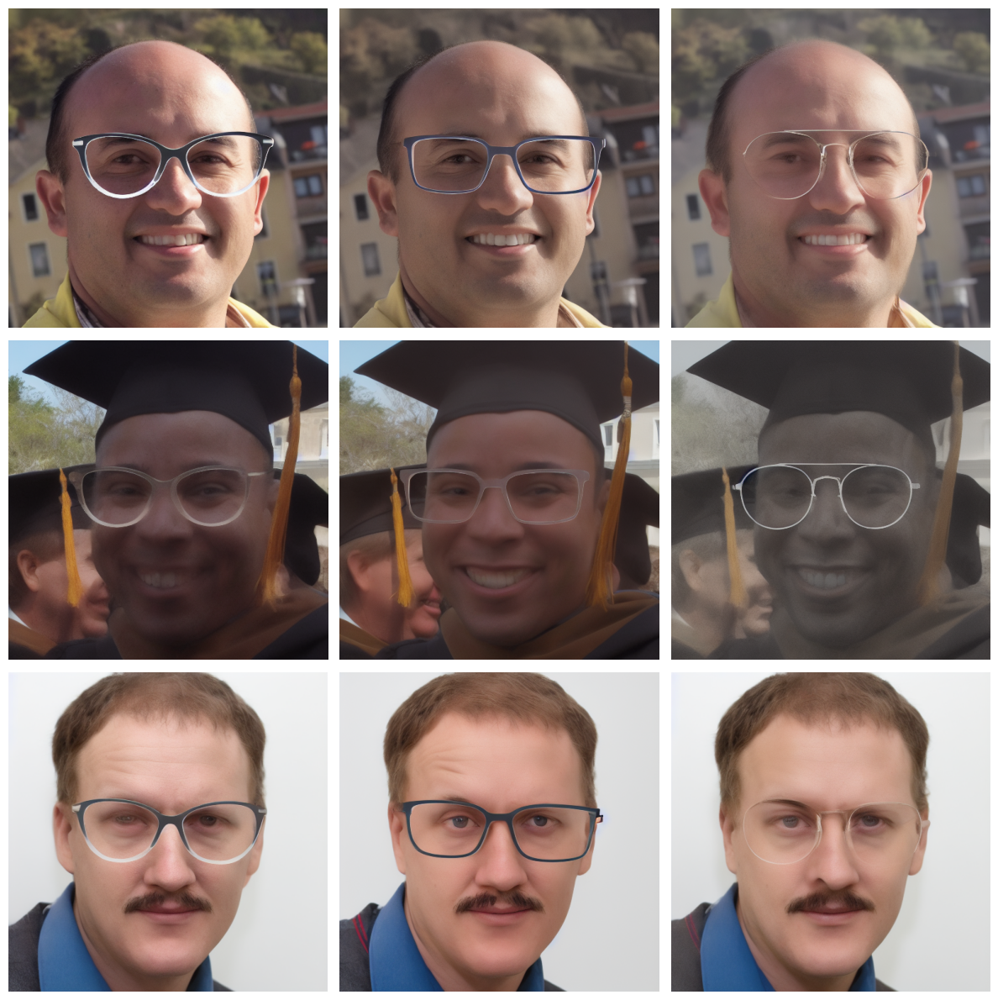

In [33]:
method_name = "instructpix2pix"

def instructpix2pix_blending(glasses_img, mask_img, face_img, device="cpu"):
    """
    InstructPix2Pix Harmonization
    Uses instruction-based image editing
    """
    
    try:
        
        # Create composite image
        face_np = np.array(face_img)
        glasses_np = np.array(glasses_img)
        mask_np = np.array(mask_img)
        mask_3d = np.stack([mask_np/255.0] * 3, axis=-1)
        
        composite = face_np * (1 - mask_3d) + glasses_np * mask_3d
        composite_img = Image.fromarray(composite.astype(np.uint8))
        
        # Apply instruction-based editing
        instruction = "Adjust lightning and shadows to be consistent within the image, make glasses sitting realistic, preserve the shape, texture and color of the glasses"
        #Adjust lightning and shadows to be consistent within the image, make glasses sitting realistic
        
        pipe_sdp2p.safety_checker = lambda images, *args, **kwargs: (images, [False])
        
        result = pipe_sdp2p(
            instruction,
            image=composite_img,
            num_inference_steps=7, # more steps - more AI-like refinement, 7 and 11 are good, sometimes 11 should be checked
            image_guidance_scale=1.9, # the higher number, more close to original
            guidance_scale=1.0, # less follows prompt
            safety_checker=None
        ).images[0]

        result = result.resize((512, 512))
        
        return result
        
    except Exception as e:
        print(f"Method 5 failed: {e}")
        return None


output_dir = f"results/diffusion_blend/{method_name}"
os.makedirs(output_dir, exist_ok=True)
os.makedirs("temp_eval", exist_ok=True)

num_faces = len(bg_imgs)
num_glasses = len(glasses_with_masks)

fig, axes = plt.subplots(nrows=num_faces, ncols=num_glasses, figsize=(4 * num_glasses, 4 * num_faces))

# If it's a 1D array (e.g. 1 face, 3 glasses), wrap it to avoid indexing errors
if num_faces == 1 or num_glasses == 1:
    axes = np.array(axes).reshape(num_faces, num_glasses)

for f_idx, bg_img in enumerate(bg_imgs):
    for g_idx, (glasses, mask) in enumerate(glasses_with_masks):
        
        # 0. Fit glasses to face
        aligned_glasses, aligned_mask = fit_glasses_to_face(bg_img, glasses, mask)
        
        # A. Run Diffusion Harmonization
        result = instructpix2pix_blending(aligned_glasses, aligned_mask, bg_img, device=device)
        
        # B. Save the result
        res_path = os.path.join(output_dir, f"FFHQ_{f_idx}x{g_idx}.png")
        result.save(res_path)
        
        # C. Create & Save Naive Copy-Paste (needed for LPIPS baseline)
        naive_result = Image.composite(aligned_glasses, bg_img, aligned_mask)
        naive_path = f"temp_eval/naive_{f_idx}x{g_idx}.png"
        naive_result.save(naive_path)
        
        # D. Save mask temporarily (needed for SAM 2 eval)
        mask_path = f"temp_eval/mask_{g_idx}.png"
        mask.save(mask_path)
        
        # E. Calculate Qualitative Scores
        lpips_score = calculate_lpips(naive_path, res_path)
        iou, mse, dice, sam_mask = calculate_sam_clip_metrics(res_path, mask_path)
        
        cv2.imwrite(os.path.join(output_dir, f"FFHQ_{f_idx}x{g_idx})sam_mask.png"), sam_mask)
        
        print(f"Face {f_idx} x Glasses {g_idx} | LPIPS (V): {lpips_score:.4f} | SAM IoU (^): {iou:.4f} | SAM Dice (V): {dice:.4f}")
        
        # F. Plot on the Grid
        ax = axes[f_idx, g_idx]
        ax.imshow(result)
        ax.axis("off")
        


plt.tight_layout()
grid_path = os.path.join(output_dir, "grid_summary.png")
plt.savefig(grid_path, dpi=600, bbox_inches='tight')
print(f"Saved individual results and grid to {output_dir}")
plt.show()

In [34]:
del pipe_sdp2p#, pipe_pbe

gc.collect()               # force Python garbage collection
torch.cuda.empty_cache()   # release cached blocks to CUDA

In [35]:
pipe_sd_i2i = StableDiffusionImg2ImgPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5",
    torch_dtype=torch.float16,
    use_safetensors=True
).to(device)

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

0it [00:00, ?it/s]

Face 0 x Glasses 0 | LPIPS (V): 0.1251 | SAM IoU (^): 0.1202 | SAM Dice (V): 0.7854


0it [00:00, ?it/s]

Face 0 x Glasses 1 | LPIPS (V): 0.1267 | SAM IoU (^): 0.0960 | SAM Dice (V): 0.8248


0it [00:00, ?it/s]

Face 0 x Glasses 2 | LPIPS (V): 0.1280 | SAM IoU (^): 0.0342 | SAM Dice (V): 0.9338


0it [00:00, ?it/s]

Face 1 x Glasses 0 | LPIPS (V): 0.1105 | SAM IoU (^): 0.1141 | SAM Dice (V): 0.7952


0it [00:00, ?it/s]

Face 1 x Glasses 1 | LPIPS (V): 0.1108 | SAM IoU (^): 0.1017 | SAM Dice (V): 0.8154


0it [00:00, ?it/s]

Face 1 x Glasses 2 | LPIPS (V): 0.1106 | SAM IoU (^): 0.0249 | SAM Dice (V): 0.9514


0it [00:00, ?it/s]

Face 2 x Glasses 0 | LPIPS (V): 0.1027 | SAM IoU (^): 0.0757 | SAM Dice (V): 0.8592


0it [00:00, ?it/s]

Face 2 x Glasses 1 | LPIPS (V): 0.1047 | SAM IoU (^): 0.0586 | SAM Dice (V): 0.8892


0it [00:00, ?it/s]

Face 2 x Glasses 2 | LPIPS (V): 0.1054 | SAM IoU (^): 0.0189 | SAM Dice (V): 0.9630
Saved individual results and grid to results/diffusion_blend/single_styletransfer_i2i


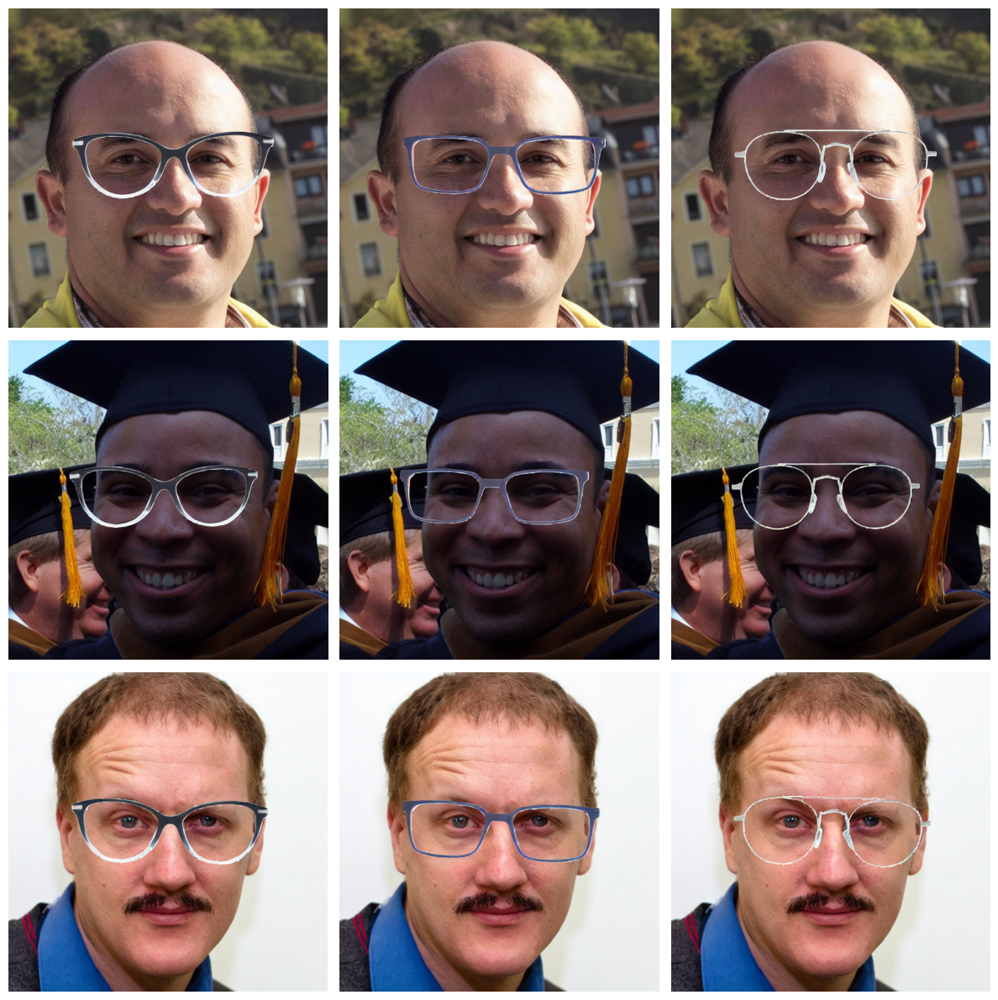

In [36]:
method_name = "single_styletransfer_i2i"

def diffusion_style_transfer_blending(glasses_img, mask_img, face_img, device="cuda"):
    """
    Diffusion-Based Style Transfer Harmonization
    Uses img2img diffusion for style harmonization
    """
    
    # Create composite image
    face_np = np.array(face_img)
    glasses_np = np.array(glasses_img)
    mask_np = np.array(mask_img)
    mask_3d = np.stack([mask_np/255.0] * 3, axis=-1)
    
    composite = face_np * (1 - mask_3d) + glasses_np * mask_3d
    composite_img = Image.fromarray(composite.astype(np.uint8))
    
    pipe_sd_i2i.safety_checker = lambda images, *args, **kwargs: (images, [False])
    
    # Apply style transfer
    result = pipe_sd_i2i(
        prompt="Adjust lightning and shadows to be consistent within the image, make glasses sitting realistic, preserve the shape, texture and color of the glasses",
        image=composite_img,
        negative_prompt="inconsistent, harsh lighting, unrealistic",
        num_inference_steps=5,
        strength=0.15, # how much noise is added
        guidance_scale=0.7 # how much to follow the prompt
    ).images[0]

    result = result.resize((512, 512))
    
    return result

output_dir = f"results/diffusion_blend/{method_name}"
os.makedirs(output_dir, exist_ok=True)
os.makedirs("temp_eval", exist_ok=True)

num_faces = len(bg_imgs)
num_glasses = len(glasses_with_masks)

fig, axes = plt.subplots(nrows=num_faces, ncols=num_glasses, figsize=(4 * num_glasses, 4 * num_faces))

# If it's a 1D array (e.g. 1 face, 3 glasses), wrap it to avoid indexing errors
if num_faces == 1 or num_glasses == 1:
    axes = np.array(axes).reshape(num_faces, num_glasses)

for f_idx, bg_img in enumerate(bg_imgs):
    for g_idx, (glasses, mask) in enumerate(glasses_with_masks):
        
        # 0. Fit glasses to face
        aligned_glasses, aligned_mask = fit_glasses_to_face(bg_img, glasses, mask)
        
        # A. Run Diffusion Harmonization
        result = diffusion_style_transfer_blending(aligned_glasses, aligned_mask, bg_img, device=device)
        
        # B. Save the result
        res_path = os.path.join(output_dir, f"FFHQ_{f_idx}x{g_idx}.png")
        result.save(res_path)
        
        # C. Create & Save Naive Copy-Paste (needed for LPIPS baseline)
        naive_result = Image.composite(aligned_glasses, bg_img, aligned_mask)
        naive_path = f"temp_eval/naive_{f_idx}x{g_idx}.png"
        naive_result.save(naive_path)
        
        # D. Save mask temporarily (needed for SAM 2 eval)
        mask_path = f"temp_eval/mask_{g_idx}.png"
        mask.save(mask_path)
        
        # E. Calculate Qualitative Scores
        lpips_score = calculate_lpips(naive_path, res_path)
        iou, mse, dice, sam_mask = calculate_sam_clip_metrics(res_path, mask_path)
        
        cv2.imwrite(os.path.join(output_dir, f"FFHQ_{f_idx}x{g_idx})sam_mask.png"), sam_mask)
        
        print(f"Face {f_idx} x Glasses {g_idx} | LPIPS (V): {lpips_score:.4f} | SAM IoU (^): {iou:.4f} | SAM Dice (V): {dice:.4f}")
        
        # F. Plot on the Grid
        ax = axes[f_idx, g_idx]
        ax.imshow(result)
        ax.axis("off")
        


plt.tight_layout()
grid_path = os.path.join(output_dir, "grid_summary.png")
plt.savefig(grid_path, dpi=600, bbox_inches='tight')
print(f"Saved individual results and grid to {output_dir}")
plt.show()

0it [00:00, ?it/s]

0it [00:00, ?it/s]

Face 0 x Glasses 0 | LPIPS (V): 0.1568 | SAM IoU (^): 0.0717 | SAM Dice (V): 0.8662


0it [00:00, ?it/s]

0it [00:00, ?it/s]

Face 0 x Glasses 1 | LPIPS (V): 0.1601 | SAM IoU (^): 0.0992 | SAM Dice (V): 0.8195


0it [00:00, ?it/s]

0it [00:00, ?it/s]

Face 0 x Glasses 2 | LPIPS (V): 0.1628 | SAM IoU (^): 0.0360 | SAM Dice (V): 0.9306


0it [00:00, ?it/s]

0it [00:00, ?it/s]

Face 1 x Glasses 0 | LPIPS (V): 0.1463 | SAM IoU (^): 0.1111 | SAM Dice (V): 0.8001


0it [00:00, ?it/s]

0it [00:00, ?it/s]

Face 1 x Glasses 1 | LPIPS (V): 0.1474 | SAM IoU (^): 0.0958 | SAM Dice (V): 0.8251


0it [00:00, ?it/s]

0it [00:00, ?it/s]

Face 1 x Glasses 2 | LPIPS (V): 0.1462 | SAM IoU (^): 0.0207 | SAM Dice (V): 0.9595


0it [00:00, ?it/s]

0it [00:00, ?it/s]

Face 2 x Glasses 0 | LPIPS (V): 0.1374 | SAM IoU (^): 0.0759 | SAM Dice (V): 0.8589


0it [00:00, ?it/s]

0it [00:00, ?it/s]

Face 2 x Glasses 1 | LPIPS (V): 0.1405 | SAM IoU (^): 0.0407 | SAM Dice (V): 0.9218


0it [00:00, ?it/s]

0it [00:00, ?it/s]

Face 2 x Glasses 2 | LPIPS (V): 0.1408 | SAM IoU (^): 0.0464 | SAM Dice (V): 0.9114
Saved individual results and grid to results/diffusion_blend/cycle_styletransfer_i2i


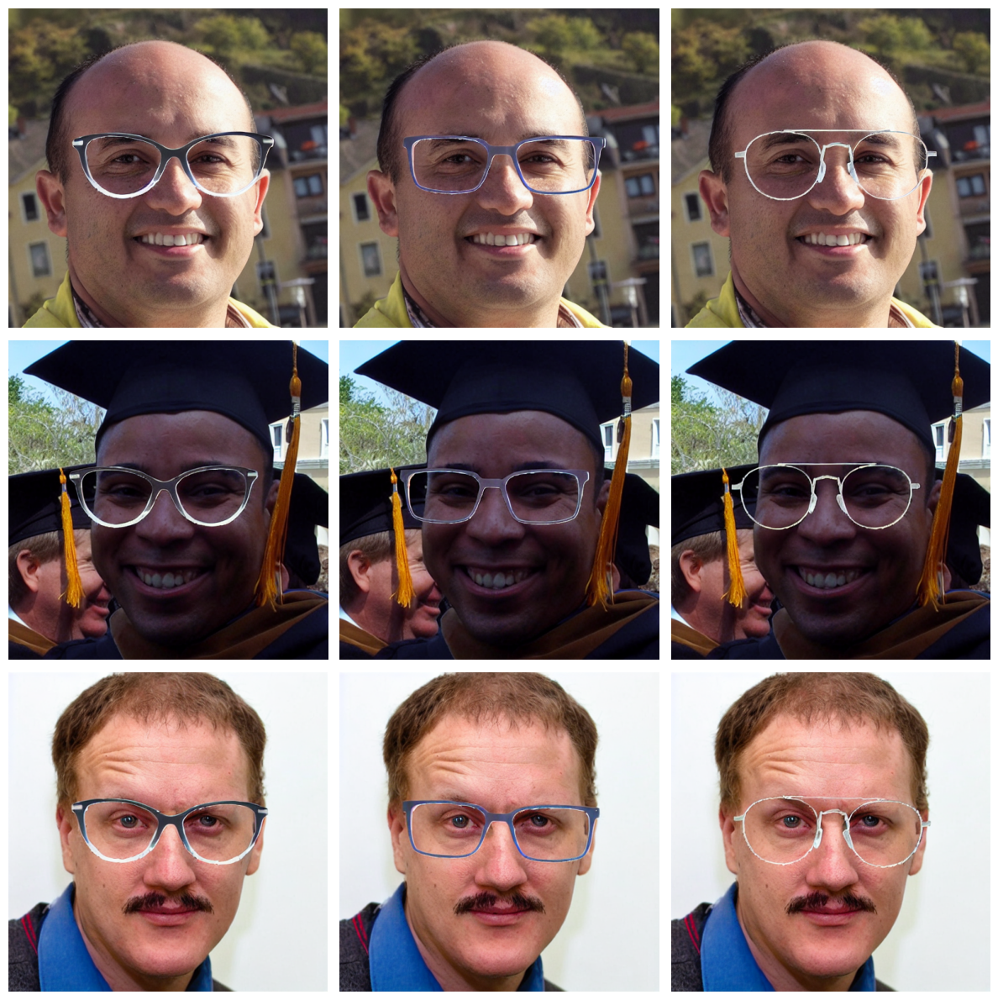

In [37]:
method_name = "cycle_styletransfer_i2i"

def cycle_consistent_blending(glasses_img, mask_img, face_img, device="cuda"):
    """
    Cycle-Consistent Diffusion Harmonization
    Uses multiple passes for cycle consistency
    """
    
    # Create initial composite
    face_np = np.array(face_img)
    glasses_np = np.array(glasses_img)
    mask_np = np.array(mask_img)
    mask_3d = np.stack([mask_np/255.0] * 3, axis=-1)
    
    composite = face_np * (1 - mask_3d) + glasses_np * mask_3d
    composite_img = Image.fromarray(composite.astype(np.uint8))
    
    pipe_sd_i2i.safety_checker = lambda images, *args, **kwargs: (images, [False])
    
    # Forward pass
    result = pipe_sd_i2i(
        prompt="Adjust lightning and shadows to be consistent within the image, make glasses sitting realistic, preserve the shape, texture and color of the glasses",
        image=composite_img,
        negative_prompt="inconsistent, harsh lighting, unrealistic",
        num_inference_steps=5,
        strength=0.15,
        guidance_scale=0.7
    ).images[0]
    
    # Refinement pass
    result = pipe_sd_i2i(
        prompt="Adjust lightning and shadows to be consistent within the image, make glasses sitting realistic, preserve the shape, texture and color of the glasses",
        image=result,
        negative_prompt="inconsistent, harsh lighting, unrealistic",
        num_inference_steps=3,
        strength=0.07,
        guidance_scale=0.6
    ).images[0]

    result = result.resize((512, 512))
    
    return result

output_dir = f"results/diffusion_blend/{method_name}"
os.makedirs(output_dir, exist_ok=True)
os.makedirs("temp_eval", exist_ok=True)

num_faces = len(bg_imgs)
num_glasses = len(glasses_with_masks)

fig, axes = plt.subplots(nrows=num_faces, ncols=num_glasses, figsize=(4 * num_glasses, 4 * num_faces))

# If it's a 1D array (e.g. 1 face, 3 glasses), wrap it to avoid indexing errors
if num_faces == 1 or num_glasses == 1:
    axes = np.array(axes).reshape(num_faces, num_glasses)

for f_idx, bg_img in enumerate(bg_imgs):
    for g_idx, (glasses, mask) in enumerate(glasses_with_masks):
        
        # 0. Fit glasses to face
        aligned_glasses, aligned_mask = fit_glasses_to_face(bg_img, glasses, mask)
        
        # A. Run Diffusion Harmonization
        result = cycle_consistent_blending(aligned_glasses, aligned_mask, bg_img, device=device)
        
        # B. Save the result
        res_path = os.path.join(output_dir, f"FFHQ_{f_idx}x{g_idx}.png")
        result.save(res_path)
        
        # C. Create & Save Naive Copy-Paste (needed for LPIPS baseline)
        naive_result = Image.composite(aligned_glasses, bg_img, aligned_mask)
        naive_path = f"temp_eval/naive_{f_idx}x{g_idx}.png"
        naive_result.save(naive_path)
        
        # D. Save mask temporarily (needed for SAM 2 eval)
        mask_path = f"temp_eval/mask_{g_idx}.png"
        mask.save(mask_path)
        
        # E. Calculate Qualitative Scores
        lpips_score = calculate_lpips(naive_path, res_path)
        iou, mse, dice, sam_mask = calculate_sam_clip_metrics(res_path, mask_path)
        
        cv2.imwrite(os.path.join(output_dir, f"FFHQ_{f_idx}x{g_idx})sam_mask.png"), sam_mask)
        
        print(f"Face {f_idx} x Glasses {g_idx} | LPIPS (V): {lpips_score:.4f} | SAM IoU (^): {iou:.4f} | SAM Dice (V): {dice:.4f}")
        
        # F. Plot on the Grid
        ax = axes[f_idx, g_idx]
        ax.imshow(result)
        ax.axis("off")
        


plt.tight_layout()
grid_path = os.path.join(output_dir, "grid_summary.png")
plt.savefig(grid_path, dpi=600, bbox_inches='tight')
print(f"Saved individual results and grid to {output_dir}")
plt.show()

In [38]:
del pipe_sd_i2i

gc.collect()               # force Python garbage collection
torch.cuda.empty_cache()   # release cached blocks to CUDA